# Bengaluru House Price Prediction - Supervised Regression Problem


# Project Goal  / Business problem

# Import Libraries

In [83]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Load Dataset

In [84]:
data= pd.read_csv(r"C:\Users\Hp\Downloads\Bengaluru_House_Data.csv")

In [85]:
data.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [86]:
data.tail()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
13315,Built-up Area,Ready To Move,Whitefield,5 Bedroom,ArsiaEx,3453,4.0,0.0,231.0
13316,Super built-up Area,Ready To Move,Richards Town,4 BHK,NaN,3600,5.0,NaN,400.0
13317,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,Mahla T,1141,2.0,1.0,60.0
13318,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,SollyCl,4689,4.0,1.0,488.0
13319,Super built-up Area,Ready To Move,Doddathoguru,1 BHK,NaN,550,1.0,1.0,17.0


In [87]:
data.shape

(13320, 9)

# Data Preprocessing

# Exploratory Data Analysis

In [88]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [89]:
#We have only 3 numerical features - bath , balcony and price
#6 categorical features - area type, availability , size , society, and total_sqft
#Target feature  ==>> price
#Price in Lakhs

In [90]:
data.describe()
#observe 75% and max value it shows huge difference

,bath,balcony,price
count,13247.000000,12711.000000,13320.000000
mean,2.692610,1.584376,112.565627
std,1.341458,0.817263,148.971674
min,1.000000,0.000000,8.000000
25%,2.000000,1.000000,50.000000
50%,2.000000,2.000000,72.000000
75%,3.000000,2.000000,120.000000
max,40.000000,3.000000,3600.000000


<Figure size 1800x1800 with 0 Axes>

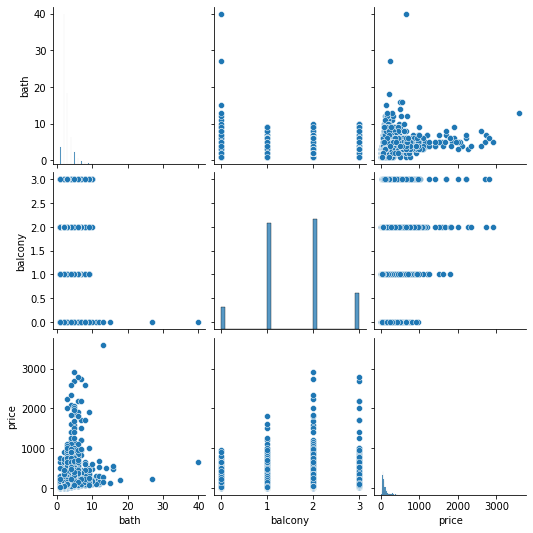

In [91]:
plt.figure(figsize=(25,25))
sns.pairplot(data)                             #bath and price have slightly linear correlation with some outliers

In [92]:
#value count for each feature
for column in data.columns:
    print(data[column].value_counts())
    print("*"*20)

Super built-up  Area    8790
Built-up  Area          2418
Plot  Area              2025
Carpet  Area              87
Name: area_type, dtype: int64
********************
Ready To Move           10581
18-Dec                    307
18-May                    295
18-Apr                    271
18-Aug                    200
19-Dec                    185
18-Jul                    143
18-Mar                    131
18-Jun                     99
20-Dec                     98
21-Dec                     93
19-Mar                     88
18-Feb                     62
18-Nov                     47
18-Jan                     43
18-Sep                     41
19-Jun                     40
18-Oct                     39
19-Jan                     39
19-Jul                     36
17-Dec                     29
20-Jan                     24
17-Oct                     21
19-Sep                     21
22-Jun                     19
19-Aug                     18
21-Jun                     17
19-Apr                 

<AxesSubplot:>

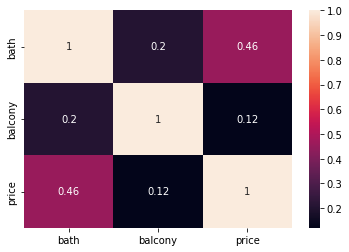

In [93]:
#correlation heatmap
num_vars = ['bath','balcony','price']
sns.heatmap(data[num_vars].corr(),annot=True) 
#correlation of bath is greater than a balcony with price

# Prepare Data for Machine Learning Model

# Data Cleaning

In [94]:
null_count = data.isnull().sum()  # find how much missing values available
print(null_count)

area_type          0
availability       0
location           1
size              16
society         5502
total_sqft         0
bath              73
balcony          609
price              0
dtype: int64


In [95]:
null_percent = data.isnull().sum()/data.shape[0]*100         # % of missing values

print(null_percent)

# Society has 41.3% missing value , need to drop

area_type        0.000000
availability     0.000000
location         0.007508
size             0.120120
society         41.306306
total_sqft       0.000000
bath             0.548048
balcony          4.572072
price            0.000000
dtype: float64


<AxesSubplot:>

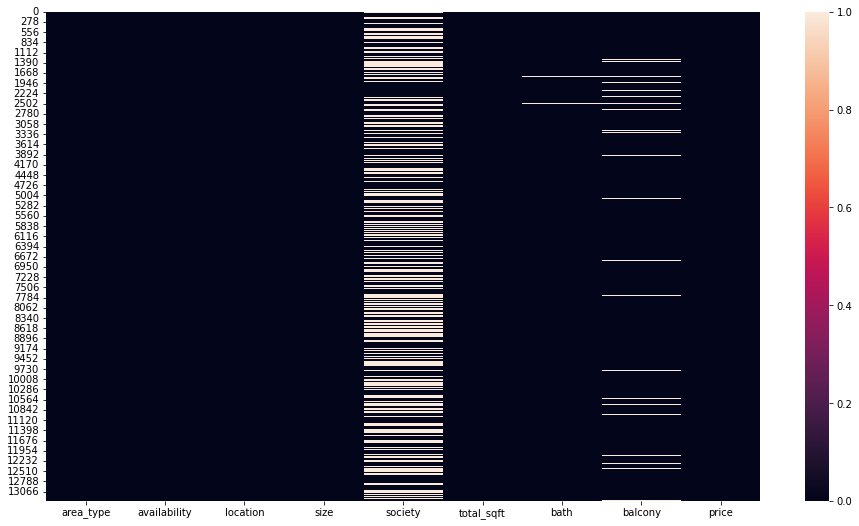

In [96]:
# visualize missing value using heatmap to get idea where is the value missing
plt.figure(figsize=(16,9))        
sns.heatmap(data.isnull()) 

# Drop Columns
As per obversation, we will drop 'area_type','availability','society' and 'balcony' from dataset

In [97]:
drop_columns=['area_type','availability','society','balcony']      

In [98]:
data.drop(columns=drop_columns,inplace=True)

In [99]:
data.head()

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.07
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00
2,Uttarahalli,3 BHK,1440,2.0,62.00
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00
4,Kothanur,2 BHK,1200,2.0,51.00


# Feature Engineering

In [100]:
# to show all the columns and rows 

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)


# Get the Statistical Information of Numerical Features

In [101]:
data.describe()    #shows only numerical columns

,bath,price
count,13247.000000,13320.000000
mean,2.692610,112.565627
std,1.341458,148.971674
min,1.000000,8.000000
25%,2.000000,50.000000
50%,2.000000,72.000000
75%,3.000000,120.000000
max,40.000000,3600.000000


In [102]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   location    13319 non-null  object 
 1   size        13304 non-null  object 
 2   total_sqft  13320 non-null  object 
 3   bath        13247 non-null  float64
 4   price       13320 non-null  float64
dtypes: float64(2), object(3)
memory usage: 520.4+ KB


# Handling Missing Values

# Missing Value Imputation

# Handling location-0.007508

In [103]:
data['location'].value_counts()

Whitefield                                            540
Sarjapur  Road                                        399
Electronic City                                       302
Kanakpura Road                                        273
Thanisandra                                           234
Yelahanka                                             213
Uttarahalli                                           186
Hebbal                                                177
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Bannerghatta Road                                     152
Hennur Road                                           152
7th Phase JP Nagar                                    149
Haralur Road                                          142
Electronic City Phase II                              132
Rajaji Nagar                                          107
Chandapura                                            100
Bellandur     

C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='location', ylabel='count'>

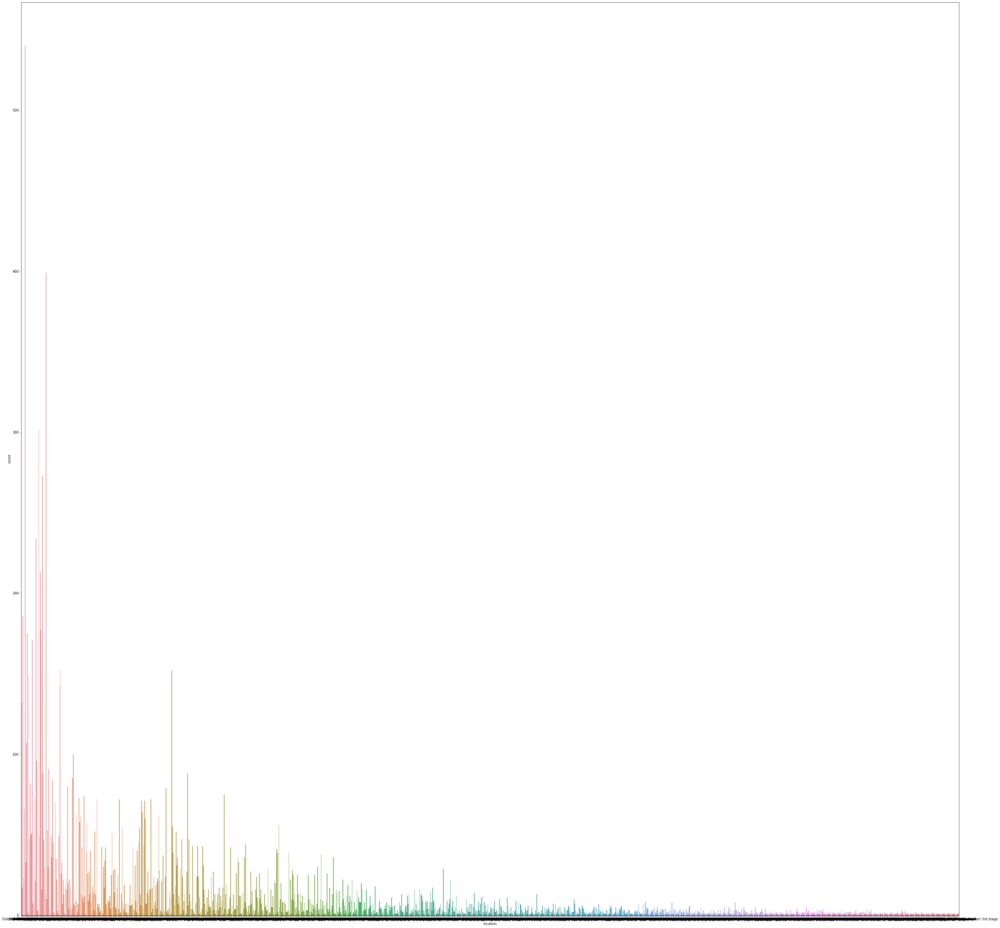

In [104]:
plt.figure(figsize=(50,50))
sns.countplot(data['location'])

In [105]:
data['location'] = data['location'].fillna('Sarjapur  Road')

# we have 1 missing values in 'location' feature , so we fill it with 'Sarjapur Road'

# Handling size-0.120120

In [106]:
data['size'].value_counts()               
#size feature shows the number of rooms

2 BHK         5199
3 BHK         4310
4 Bedroom      826
4 BHK          591
3 Bedroom      547
1 BHK          538
2 Bedroom      329
5 Bedroom      297
6 Bedroom      191
1 Bedroom      105
8 Bedroom       84
7 Bedroom       83
5 BHK           59
9 Bedroom       46
6 BHK           30
7 BHK           17
1 RK            13
10 Bedroom      12
9 BHK            8
8 BHK            5
11 BHK           2
11 Bedroom       2
10 BHK           2
14 BHK           1
13 BHK           1
12 Bedroom       1
27 BHK           1
43 Bedroom       1
16 BHK           1
19 BHK           1
18 Bedroom       1
Name: size, dtype: int64

C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='size', ylabel='count'>

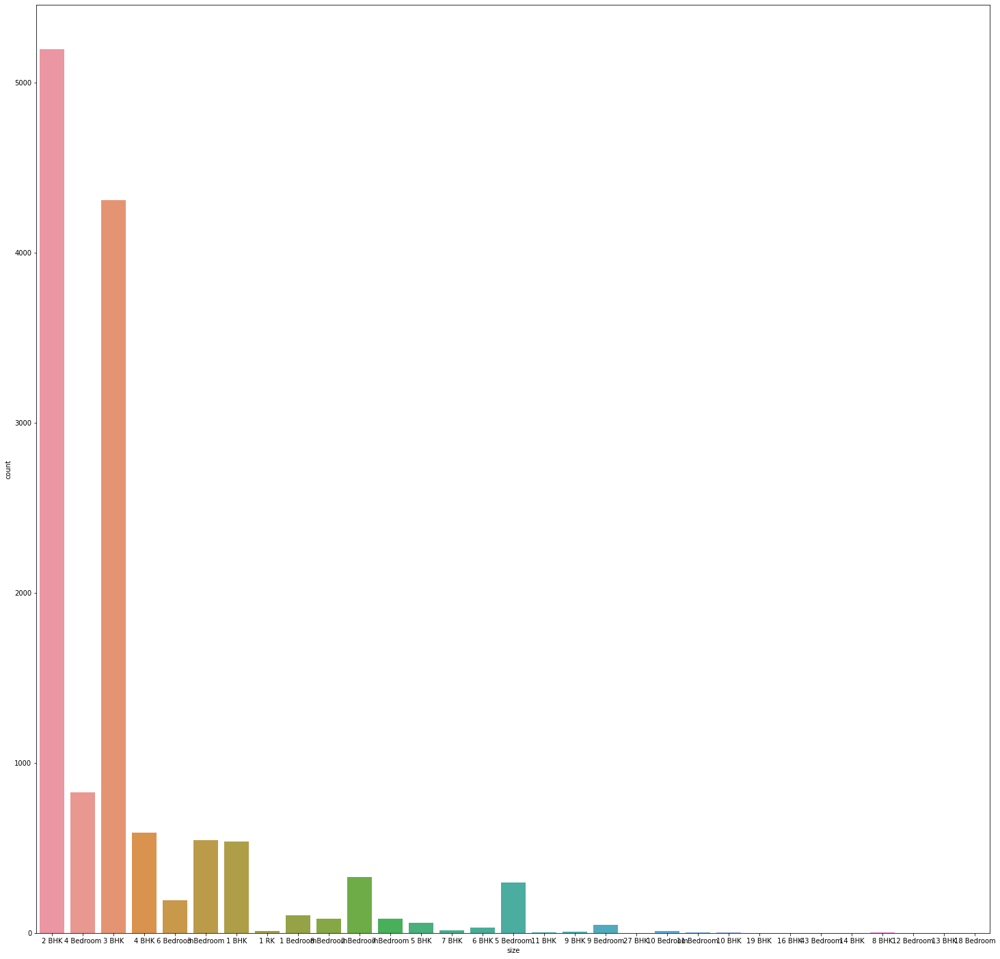

In [107]:
plt.figure(figsize=(25,25))
sns.countplot(data['size'])

In [108]:
data['size'] = data['size'].fillna('2 BHK')     # fill missing values with mode= '2 BHK'

In [109]:
data.isnull().sum()  # size feature has no missing value

location       0
size           0
total_sqft     0
bath          73
price          0
dtype: int64

In [110]:
"""
in size feature we assume that 
2BHK = 2 Bedroom == 2RK  
so takes only number and removes sufix text
"""

data['bhk'] = data['size'].str.split().str.get(0).astype(int)

# we make a dummy variable 'bhk' from the original feature 'size' and takes only number and removes sufix text

In [111]:
data['bhk']

0         2
1         4
2         3
3         3
4         2
5         2
6         4
7         4
8         3
9         6
10        3
11        4
12        2
13        2
14        3
15        2
16        3
17        3
18        3
19        2
20        1
21        3
22        4
23        3
24        1
25        3
26        2
27        3
28        2
29        3
30        4
31        3
32        3
33        3
34        3
35        2
36        2
37        3
38        3
39        2
40        2
41        3
42        1
43        1
44        2
45        8
46        2
47        2
48        2
49        2
50        2
51        3
52        3
53        2
54        3
55        2
56        4
57        2
58        6
59        2
60        3
61        2
62        4
63        2
64        8
65        2
66        2
67        2
68        8
69        2
70        3
71        2
72        3
73        2
74        3
75        2
76        2
77        3
78        2
79        6
80        3
81        4
82        2
83  

In [112]:
data[data.bhk>20]      # they are outliers and we have to remove them

,location,size,total_sqft,bath,price,bhk
1718,2Electronic City Phase II,27 BHK,8000,27.0,230.0,27
4684,Munnekollal,43 Bedroom,2400,40.0,660.0,43


# Handling bath-0.548048

In [113]:
data['bath'].value_counts()

2.0     6908
3.0     3286
4.0     1226
1.0      788
5.0      524
6.0      273
7.0      102
8.0       64
9.0       43
10.0      13
12.0       7
13.0       3
11.0       3
16.0       2
27.0       1
40.0       1
15.0       1
14.0       1
18.0       1
Name: bath, dtype: int64

C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='bath', ylabel='count'>

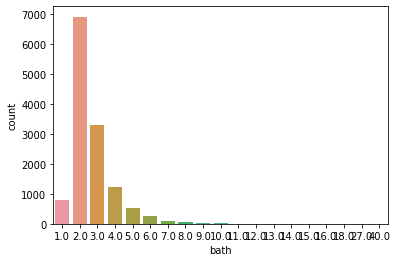

In [114]:
sns.countplot(data['bath'])

In [115]:
data['bath'] = data['bath'].fillna(data['bath'].median())

In [116]:
data.info()    # now there are no missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   location    13320 non-null  object 
 1   size        13320 non-null  object 
 2   total_sqft  13320 non-null  object 
 3   bath        13320 non-null  float64
 4   price       13320 non-null  float64
 5   bhk         13320 non-null  int32  
dtypes: float64(2), int32(1), object(3)
memory usage: 572.5+ KB


# Handling total_sqft

In [117]:
data['total_sqft'].value_counts()


# here we observe that 'total_sqft' contain string value in diff format
# float ,int like values 1689.28,817
#range value : 540 - 740
# number and string :  142.845q. Meter , 117Sq. Yards , 1Grounds


1200                 843
1100                 221
1500                 205
2400                 196
600                  180
1000                 172
1350                 133
1050                 123
1300                 117
1250                 114
900                  112
1400                 108
1800                 104
1150                 101
1600                 101
1140                  91
2000                  83
1450                  70
1650                  69
800                   67
3000                  66
1075                  66
1020                  63
2500                  62
1550                  60
1160                  60
1125                  60
950                   59
1180                  58
1700                  58
1260                  57
1255                  56
1220                  55
1080                  55
1070                  53
700                   52
750                   52
1225                  48
4000                  48
1175                  48


In [118]:
data['total_sqft'].unique()

# best strategy is to convert it into number by spliiting it

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

In [119]:
def convertRange(x):
    
    temp = x.split('-')
    if len(temp) == 2:
        return(float(temp[0])+float(temp[1]))/2
    try:
        return float(x)
    except:
        return None
    

In [120]:
data['total_sqft'] = data['total_sqft'].apply(convertRange)

In [121]:
data.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3
4,Kothanur,2 BHK,1200.0,2.0,51.00,2


# Price Per Square Feet

In [122]:
# Create new feature that is price per square feet
# it helps to find outliers

#price in lakh so convert into rupee and then / by total_sqft

data['price_per_sqft']=data['price']*100000/data['total_sqft']

In [123]:
data['price_per_sqft']

0        3.699811e+03
1        4.615385e+03
2        4.305556e+03
3        6.245891e+03
4        4.250000e+03
5        3.247863e+03
6        7.467057e+03
7        1.818182e+04
8        4.828244e+03
9        3.627451e+04
10       3.888889e+03
11       1.059246e+04
12       3.800000e+03
13       3.636364e+03
14       6.577778e+03
15       6.255319e+03
16       4.067797e+03
17       3.896104e+03
18       1.046931e+04
19       4.363636e+03
20       2.500000e+03
21       6.951567e+03
22       1.357143e+04
23       5.829089e+03
24       4.950980e+03
25       4.480000e+03
26       3.500000e+03
27       5.031056e+03
28       4.237185e+03
29       4.585366e+03
30       7.515152e+03
31       3.255814e+03
32       6.988636e+03
33       3.389841e+03
34       6.493506e+03
35       5.142857e+03
36       4.252336e+03
37       7.250580e+03
38       4.350388e+03
39       3.937008e+03
40       6.250000e+03
41       3.030303e+03
42       6.333333e+03
43       7.272727e+03
44       6.897666e+03
45       3

In [124]:
data.describe()

,total_sqft,bath,price,bhk,price_per_sqft
count,13274.000000,13320.000000,13320.000000,13320.000000,1.327400e+04
mean,1559.626694,2.688814,112.565627,2.802778,7.907501e+03
std,1238.405258,1.338754,148.971674,1.294496,1.064296e+05
min,1.000000,1.000000,8.000000,1.000000,2.678298e+02
25%,1100.000000,2.000000,50.000000,2.000000,4.266865e+03
50%,1276.000000,2.000000,72.000000,3.000000,5.434306e+03
75%,1680.000000,3.000000,120.000000,3.000000,7.311746e+03
max,52272.000000,40.000000,3600.000000,43.000000,1.200000e+07


In [125]:
data['location'].value_counts()

Whitefield                                            540
Sarjapur  Road                                        400
Electronic City                                       302
Kanakpura Road                                        273
Thanisandra                                           234
Yelahanka                                             213
Uttarahalli                                           186
Hebbal                                                177
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Bannerghatta Road                                     152
Hennur Road                                           152
7th Phase JP Nagar                                    149
Haralur Road                                          142
Electronic City Phase II                              132
Rajaji Nagar                                          107
Chandapura                                            100
Bellandur     

In [126]:
data['location'] = data['location'].apply(lambda x: x.strip())


In [127]:
location_count = data['location'].value_counts()

In [128]:
location_count

Whitefield                                            541
Sarjapur  Road                                        400
Electronic City                                       304
Kanakpura Road                                        273
Thanisandra                                           237
Yelahanka                                             213
Uttarahalli                                           186
Hebbal                                                177
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Hennur Road                                           152
Bannerghatta Road                                     152
7th Phase JP Nagar                                    149
Haralur Road                                          142
Electronic City Phase II                              132
Rajaji Nagar                                          107
Chandapura                                            100
Bellandur     

In [129]:
location_count_less_10 = location_count[location_count<=10]
location_count_less_10

Dairy Circle                                          10
Nagappa Reddy Layout                                  10
Basapura                                              10
1st Block Koramangala                                 10
Sector 1 HSR Layout                                   10
Gunjur Palya                                          10
Naganathapura                                         10
BTM 1st Stage                                         10
Nagadevanahalli                                       10
Dodsworth Layout                                      10
Sadashiva Nagar                                       10
Ganga Nagar                                           10
Kalkere                                               10
Vishwanatha Nagenahalli                                9
Chennammana Kere                                       9
2nd Phase JP Nagar                                     9
Jakkur Plantation                                      9
B Narayanapura                 

In [130]:
data['location'] = data['location'].apply(lambda x: 'other' if x in location_count_less_10 else x )

In [131]:
data['location'].value_counts()

other                          2885
Whitefield                      541
Sarjapur  Road                  400
Electronic City                 304
Kanakpura Road                  273
Thanisandra                     237
Yelahanka                       213
Uttarahalli                     186
Hebbal                          177
Marathahalli                    175
Raja Rajeshwari Nagar           171
Bannerghatta Road               152
Hennur Road                     152
7th Phase JP Nagar              149
Haralur Road                    142
Electronic City Phase II        132
Rajaji Nagar                    107
Chandapura                      100
Bellandur                        96
KR Puram                         91
Electronics City Phase 1         88
Hoodi                            88
Yeshwanthpur                     85
Begur Road                       84
Sarjapur                         82
Kasavanhalli                     80
Harlur                           79
Banashankari                

In [132]:
data

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.000,2.0,39.070,2,3.699811e+03
1,Chikka Tirupathi,4 Bedroom,2600.000,5.0,120.000,4,4.615385e+03
2,Uttarahalli,3 BHK,1440.000,2.0,62.000,3,4.305556e+03
3,Lingadheeranahalli,3 BHK,1521.000,3.0,95.000,3,6.245891e+03
4,Kothanur,2 BHK,1200.000,2.0,51.000,2,4.250000e+03
5,Whitefield,2 BHK,1170.000,2.0,38.000,2,3.247863e+03
6,Old Airport Road,4 BHK,2732.000,4.0,204.000,4,7.467057e+03
7,Rajaji Nagar,4 BHK,3300.000,4.0,600.000,4,1.818182e+04
8,Marathahalli,3 BHK,1310.000,3.0,63.250,3,4.828244e+03
9,other,6 Bedroom,1020.000,6.0,370.000,6,3.627451e+04


# Outlier detection and Removal

In [133]:
data.describe()

,total_sqft,bath,price,bhk,price_per_sqft
count,13274.000000,13320.000000,13320.000000,13320.000000,1.327400e+04
mean,1559.626694,2.688814,112.565627,2.802778,7.907501e+03
std,1238.405258,1.338754,148.971674,1.294496,1.064296e+05
min,1.000000,1.000000,8.000000,1.000000,2.678298e+02
25%,1100.000000,2.000000,50.000000,2.000000,4.266865e+03
50%,1276.000000,2.000000,72.000000,3.000000,5.434306e+03
75%,1680.000000,3.000000,120.000000,3.000000,7.311746e+03
max,52272.000000,40.000000,3600.000000,43.000000,1.200000e+07


In [134]:
# function to create histogram and boxplot


def diagnostic_plots(df,variable):  # function takes a dataframe df and the variable of interest as arguments
    plt.figure(figsize=(16,4))      # define figure size
    
    # histogram
    plt.subplot(1,3,1)              
    sns.distplot(df[variable], bins=30)
    plt.title("Histogram")
    
    #boxplot
    plt.subplot(1,3,3)              
    sns.boxplot(y=df[variable])
    plt.title("Boxplot")
  
    plt.show()

*****total_sqft*****


C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


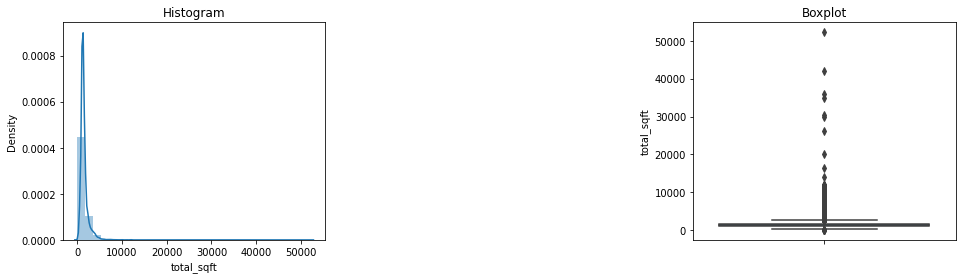

*****bath*****


C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


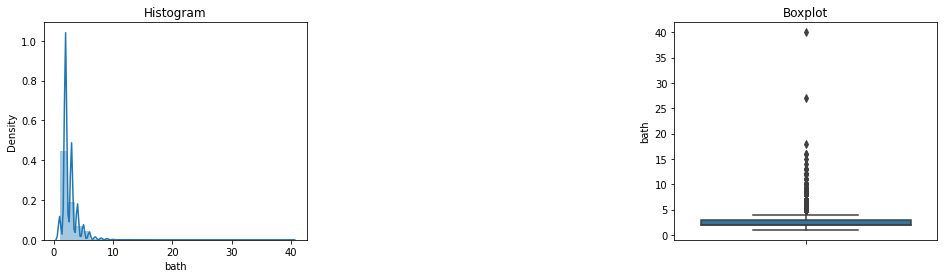

*****price*****


C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


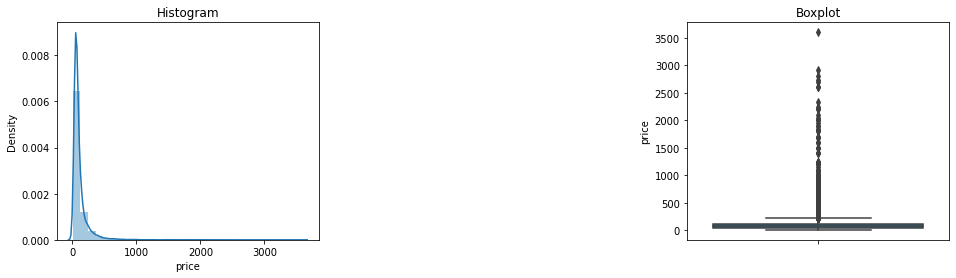

*****bhk*****


C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


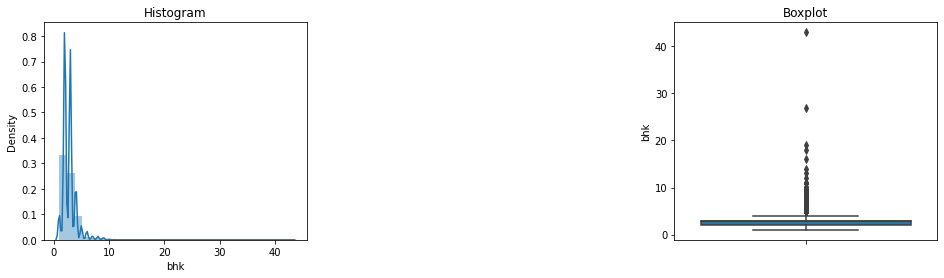

In [135]:
num_var = ['total_sqft','bath','price','bhk']
for var in num_var:
    print("*****{}*****".format(var))
    diagnostic_plots(data,var)

In [136]:
(data['total_sqft']/data['bhk']).describe()          #how many sqft in 1 bhk

count    13274.000000
mean       575.074878
std        388.205175
min          0.250000
25%        473.333333
50%        552.500000
75%        625.000000
max      26136.000000
dtype: float64

In [137]:
# here we consider if 1 bhk total_sqft are < 300 then we are going to remove them

data=data[((data['total_sqft']/data['bhk'])>=300)]

In [138]:
data.describe()      

,total_sqft,bath,price,bhk,price_per_sqft
count,12530.000000,12530.000000,12530.000000,12530.000000,12530.000000
mean,1594.564544,2.559537,111.382401,2.650838,6303.979357
std,1261.271296,1.077938,152.077329,0.976678,4162.237981
min,300.000000,1.000000,8.440000,1.000000,267.829813
25%,1116.000000,2.000000,49.000000,2.000000,4210.526316
50%,1300.000000,2.000000,70.000000,3.000000,5294.117647
75%,1700.000000,3.000000,115.000000,3.000000,6916.666667
max,52272.000000,16.000000,3600.000000,16.000000,176470.588235


In [139]:
data.shape

(12530, 7)

In [140]:
data.price_per_sqft.describe()  #I have to remove outlier 'max value=176470.588235' so make a function remove_outliers_sqft

count     12530.000000
mean       6303.979357
std        4162.237981
min         267.829813
25%        4210.526316
50%        5294.117647
75%        6916.666667
max      176470.588235
Name: price_per_sqft, dtype: float64

In [141]:
# Removing outliers using help of 'price_per_sqft' taking std and mean per location 
def remove_outliers_sqft(df):
    df_output = pd.DataFrame()
    for key, subdf in df.groupby('location'):
        m = np.mean(subdf.price_per_sqft)
        st = np.std(subdf.price_per_sqft)
        gen_df = subdf[(subdf.price_per_sqft>(m-st))&(subdf.price_per_sqft<=(m+st))]
        df_output=pd.concat([df_output, gen_df], ignore_index=True)
    return df_output
data=remove_outliers_sqft(data)
data.describe()

,total_sqft,bath,price,bhk,price_per_sqft
count,10301.000000,10301.000000,10301.000000,10301.000000,10301.000000
mean,1508.440608,2.471702,91.286372,2.574896,5659.062876
std,880.694214,0.979449,86.342786,0.897649,2265.774749
min,300.000000,1.000000,10.000000,1.000000,1250.000000
25%,1110.000000,2.000000,49.000000,2.000000,4244.897959
50%,1286.000000,2.000000,67.000000,2.000000,5175.600739
75%,1650.000000,3.000000,100.000000,3.000000,6428.571429
max,30400.000000,16.000000,2200.000000,16.000000,24509.803922


In [142]:
data.shape

(10301, 7)

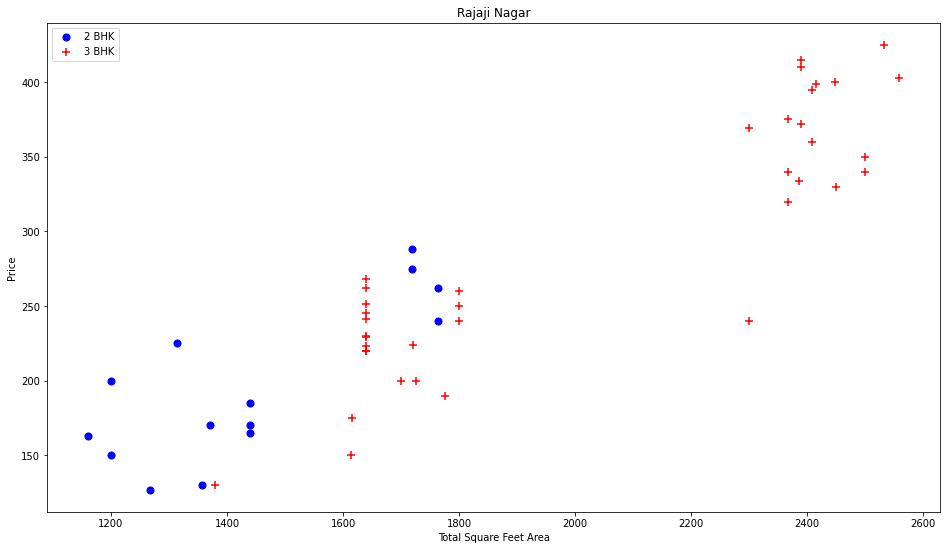

In [143]:
def plot_scatter_chart(df,location):
    bhk2 = df[(df.location==location) & (df.bhk==2)]
    bhk3 = df[(df.location==location) & (df.bhk==3)]
    plt.figure(figsize=(16,9))
    plt.scatter(bhk2.total_sqft, bhk2.price , color='Blue' , label='2 BHK' , s=50)
    plt.scatter(bhk3.total_sqft, bhk3.price , color='Red' , label='3 BHK' , s=50 , marker="+")
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price")
    plt.title(location)
    plt.legend()
    
plot_scatter_chart(data, "Rajaji Nagar") 


#In below scatterplot we observe that at same location price of '3 BHK' is < than the price of '2BHK' 
#so it is outlier

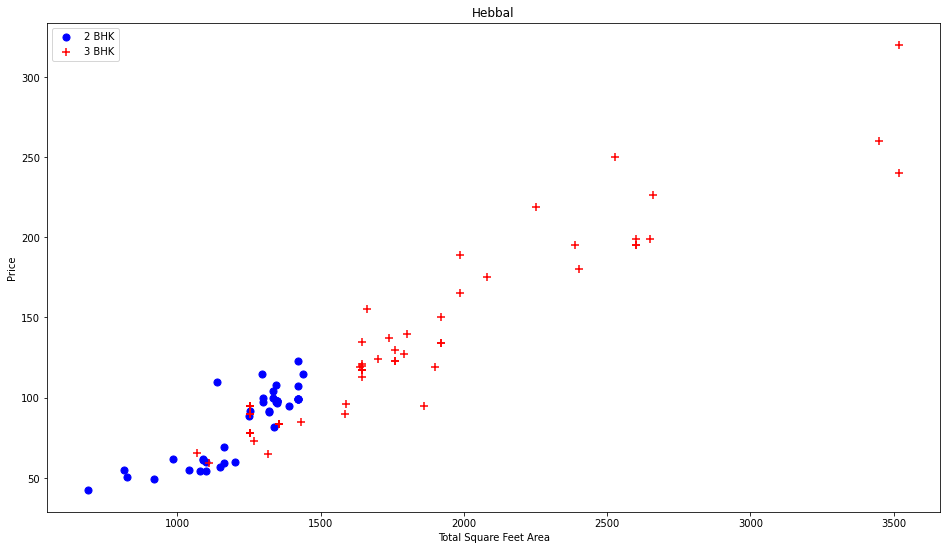

In [144]:
plot_scatter_chart(data, "Hebbal") 

#In below scatterplot we observe that at same location price of '3 BHK' is < than the price of '2BHK' 
#so it is outlier

In [145]:
# Removing BHK outliers
def bhk_outlier_remove(df):
    exclude_indices=np.array([])
    for location, location_df in df.groupby('location'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bhk'):
            bhk_stats[bhk]={
                'mean':np.mean(bhk_df.price_per_sqft),
                'std':np.std(bhk_df.price_per_sqft),
                'count':bhk_df.shape[0]
            }
       # print(location,bhk_stats)  
        for bhk , bhk_df in location_df.groupby('bhk'):
            stats= bhk_stats.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')   

In [146]:
data=bhk_outlier_remove(data)

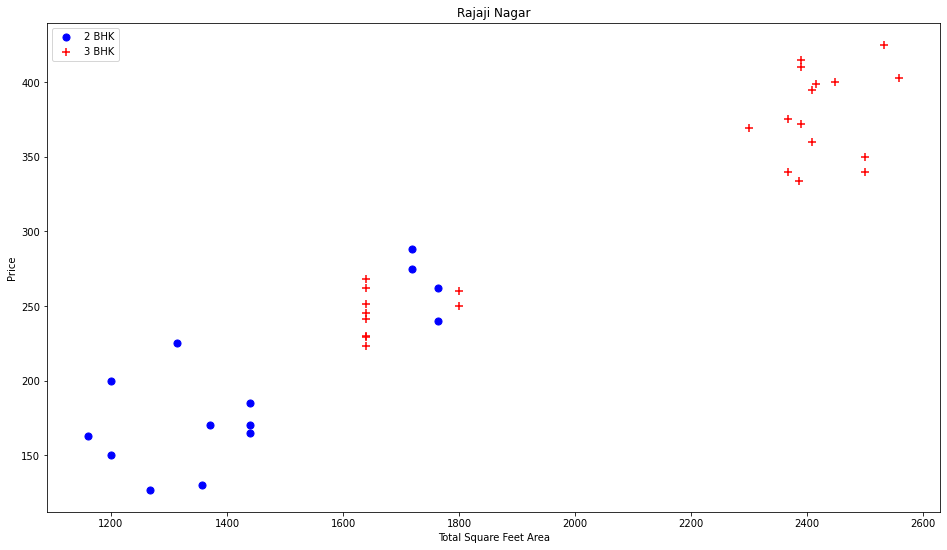

In [147]:
plot_scatter_chart(data, "Rajaji Nagar") 

#In below scatterplot most of the red data points remove from blue points

In [148]:
data

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,1st Block Jayanagar,4 BHK,2850.000,4.0,428.000,4,15017.543860
1,1st Block Jayanagar,3 BHK,1630.000,3.0,194.000,3,11901.840491
2,1st Block Jayanagar,3 BHK,1875.000,2.0,235.000,3,12533.333333
3,1st Block Jayanagar,3 BHK,1200.000,2.0,130.000,3,10833.333333
4,1st Block Jayanagar,2 BHK,1235.000,2.0,148.000,2,11983.805668
5,1st Block Jayanagar,4 BHK,2750.000,4.0,413.000,4,15018.181818
6,1st Block Jayanagar,4 BHK,2450.000,4.0,368.000,4,15020.408163
8,1st Phase JP Nagar,3 BHK,1875.000,3.0,167.000,3,8906.666667
9,1st Phase JP Nagar,5 Bedroom,1500.000,5.0,85.000,5,5666.666667
10,1st Phase JP Nagar,3 BHK,2065.000,4.0,210.000,3,10169.491525


C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: Futur

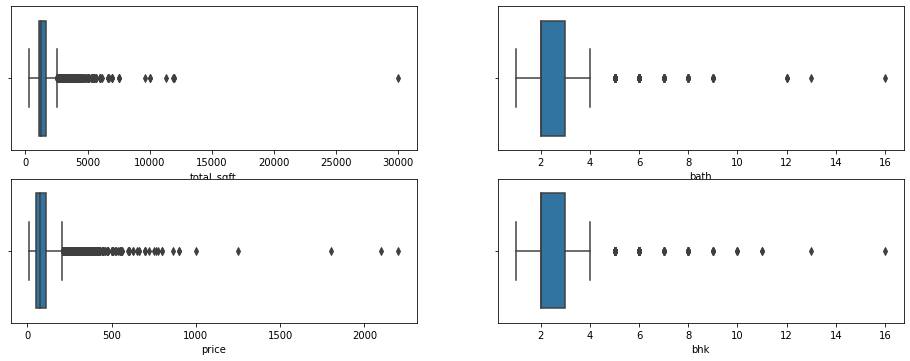

In [149]:
plt.figure(figsize=(16,9))
for i,var in enumerate(num_var):
    plt.subplot(3,2,i+1)
    sns.boxplot(data[var])
    
# We remove maximum outliers from our dataset    

In [150]:
data.shape

(7360, 7)

In [151]:
data.drop(columns=['size', 'price_per_sqft'], inplace=True)

# Cleaned Data

In [152]:
data.head()

,location,total_sqft,bath,price,bhk
0,1st Block Jayanagar,2850.0,4.0,428.0,4
1,1st Block Jayanagar,1630.0,3.0,194.0,3
2,1st Block Jayanagar,1875.0,2.0,235.0,3
3,1st Block Jayanagar,1200.0,2.0,130.0,3
4,1st Block Jayanagar,1235.0,2.0,148.0,2


In [153]:
data.to_csv('Cleaned_data.csv', index=False)  # test ML model on this data
#Ml model train on this data and got best score

In [154]:
data.shape

(7360, 5)

# Split Dataset in train and test

In [155]:
X = data.drop(columns=['price'])

In [156]:
y = data['price']

In [157]:
print("Shape of X=",X.shape)
print("Shape of y=",y.shape)


Shape of X= (7360, 4)
Shape of y= (7360,)


In [158]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score

In [159]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=3)

In [160]:
print("Shape of X_train:",X_train.shape)
print("Shape of y_train:",y_train.shape)
print("Shape of X_test:",X_test.shape)
print("Shape of y_test:",y_test.shape)

Shape of X_train: (5888, 4)
Shape of y_train: (5888,)
Shape of X_test: (1472, 4)
Shape of y_test: (1472,)


# Building Model using Linear Regression

In [161]:
column_trans = make_column_transformer((OneHotEncoder(sparse=False), ['location']), remainder='passthrough')
scaler = StandardScaler()
lr = LinearRegression(normalize=True)

In [162]:
pipe = make_pipeline(column_trans, scaler, lr)

In [163]:
pipe.fit(X_train, y_train)

C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['location'])])),
                ('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression(normalize=True))])

In [164]:
y_pred_lr = pipe.predict(X_test)

In [165]:
r2_score(y_test, y_pred_lr)

0.801798227439197

# Applying Lasso

In [166]:
lasso = Lasso()

In [167]:
pipe = make_pipeline(column_trans, scaler, lasso)

In [168]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['location'])])),
                ('standardscaler', StandardScaler()), ('lasso', Lasso())])

In [169]:
y_pred_lasso = pipe.predict(X_test)

In [170]:
r2_score(y_test, y_pred_lasso)

0.7901481511894175


# Applying Ridge

In [171]:
ridge = Ridge()

In [172]:
pipe = make_pipeline(column_trans, scaler, ridge)

In [173]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['location'])])),
                ('standardscaler', StandardScaler()), ('ridge', Ridge())])

In [174]:
y_pred_ridge = pipe.predict(X_test)


In [175]:
r2_score(y_test, y_pred_ridge)

0.8018774222146579

In [179]:
print('No Regularization : ', r2_score(y_test, y_pred_lr))
print('Lasso Regularization : ', r2_score(y_test, y_pred_lasso))
print('Ridge Regularization : ', r2_score(y_test, y_pred_ridge))

No Regularization :  0.801798227439197
Lasso Regularization :  0.7901481511894175
Ridge Regularization :  0.8018774222146579


In [180]:
#save model
import pickle
pickle.dump(pipe, open('RidgeModel.pkl','wb'))